In [19]:
import os
import cv2
import sys
import random
import math
import re
import time
import numpy as np
import itertools
import logging
import json
from collections import OrderedDict
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import skimage
import glob


from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
import bottle

# Root directory of the project
#ROOT_DIR = os.getcwd()

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library


custom_WEIGHTS_PATH = sorted(glob.glob("/logs/*/mask_rcnn_bottle_*.h5"))

custom_WEIGHTS_PATH= os.path.join(ROOT_DIR,'logs/mask_rcnn_bottle_0100.h5')



%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

config = bottle.BottleConfig()
custom_DIR = os.path.join(ROOT_DIR, "dataset")

class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.9 # options 0.7 or 0.5
    DETECTION_MAX_INSTANCES = 512
    MAX_GT_INSTANCES = 512
config = InferenceConfig()
config.display()

# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        512
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [20]:
# Load validation dataset
dataset_val = bottle.BottleDataset()
dataset_val.load_bottle(custom_DIR, "val")

dataset_train = bottle.BottleDataset()
dataset_train.load_bottle(custom_DIR, "train")


# Must call before using the dataset
dataset_val.prepare()
dataset_train.prepare()

print("Images: {}\nClasses: {}".format(len(dataset_val.image_ids), dataset_val.class_names))
print("Images: {}\nClasses: {}".format(len(dataset_train.image_ids), dataset_train.class_names))
#print(dataset_train.image_ids)
#print(dataset_val.image_ids)

Images: 15
Classes: ['BG', 'bottle']
Images: 177
Classes: ['BG', 'bottle']


In [21]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

# load the last model you trained
# weights_path = model.find_last()[1]

# Load weights
print("Loading weights ", custom_WEIGHTS_PATH)
model.load_weights(custom_WEIGHTS_PATH, by_name=True)

from importlib import reload 
reload(visualize)

Loading weights  /home/jaikumar/FinalMaskRCNN/MaskRCNN/logs/mask_rcnn_bottle_0100.h5


<module 'mrcnn.visualize' from '/home/jaikumar/\x1b[D/envs/imgaugmask/lib/python3.7/site-packages/mask_rcnn-2.1-py3.7.egg/mrcnn/visualize.py'>

=== 0
image ID: bottle.ActiOn_82.jpg (0) /home/jaikumar/FinalMaskRCNN/MaskRCNN/dataset/val/ActiOn_82.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  391.00000  max:  796.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
=== 1
image ID: bottle.ActiOn_85.png (1) /home/jaikumar/FinalMaskRCNN/MaskRCNN/dataset/val/ActiOn_85.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  u

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:    7.00000  max: 1013.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
=== 11
image ID: bottle.ActiOn_98.jpg (11) /home/jaikumar/FinalMaskRCNN/MaskRCNN/dataset/val/ActiOn_98.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (2,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (2, 4)                min:  158.00000  max:  742.00000  int32
gt_mask                 

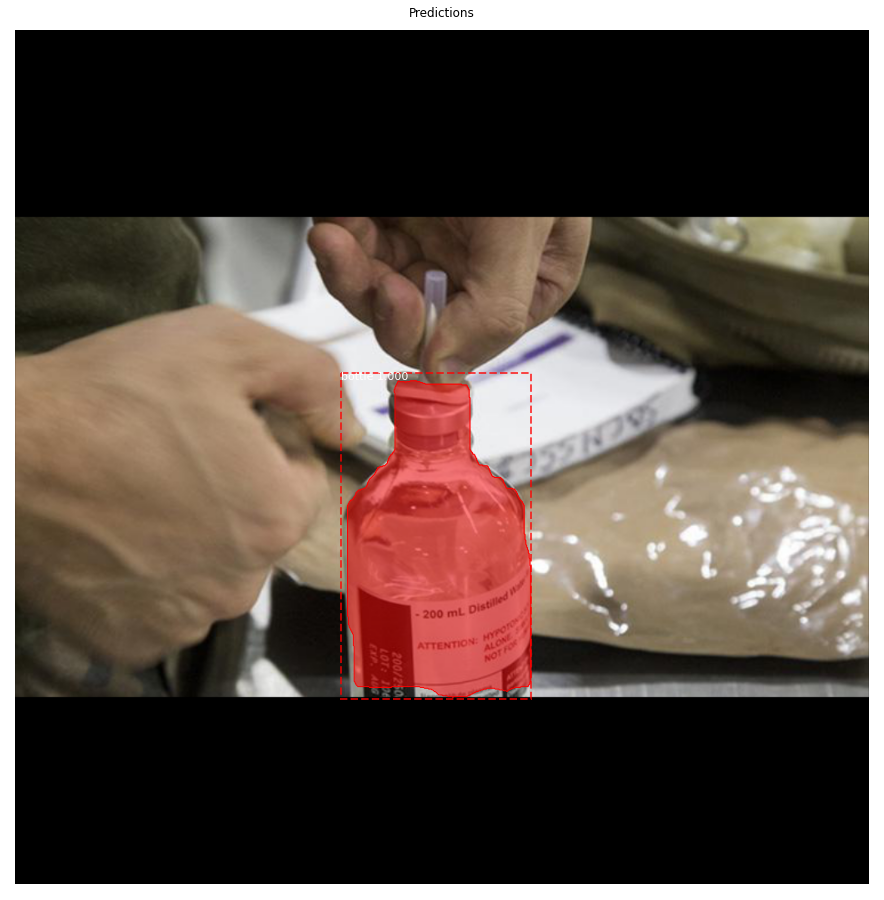

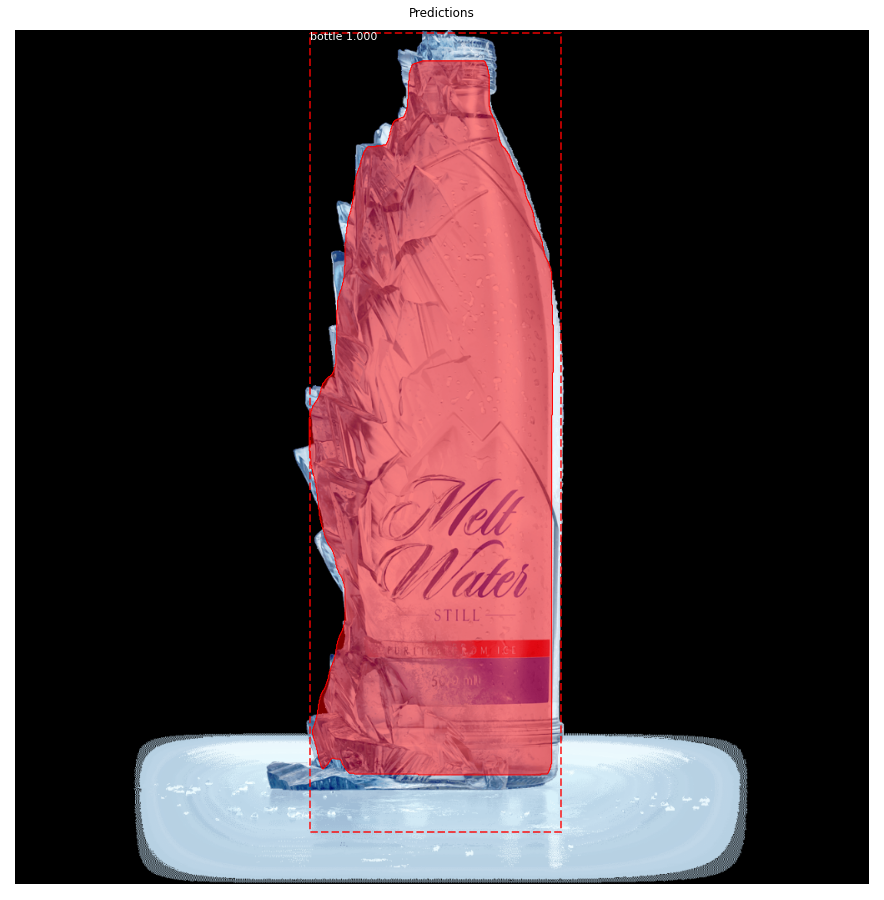

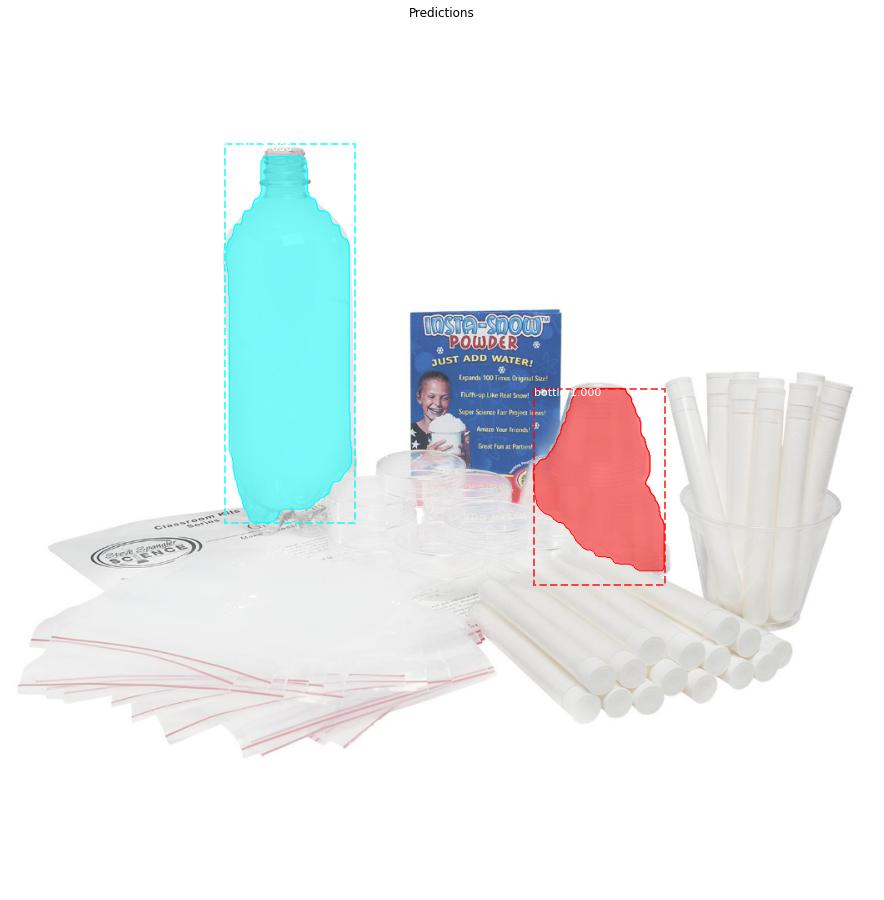

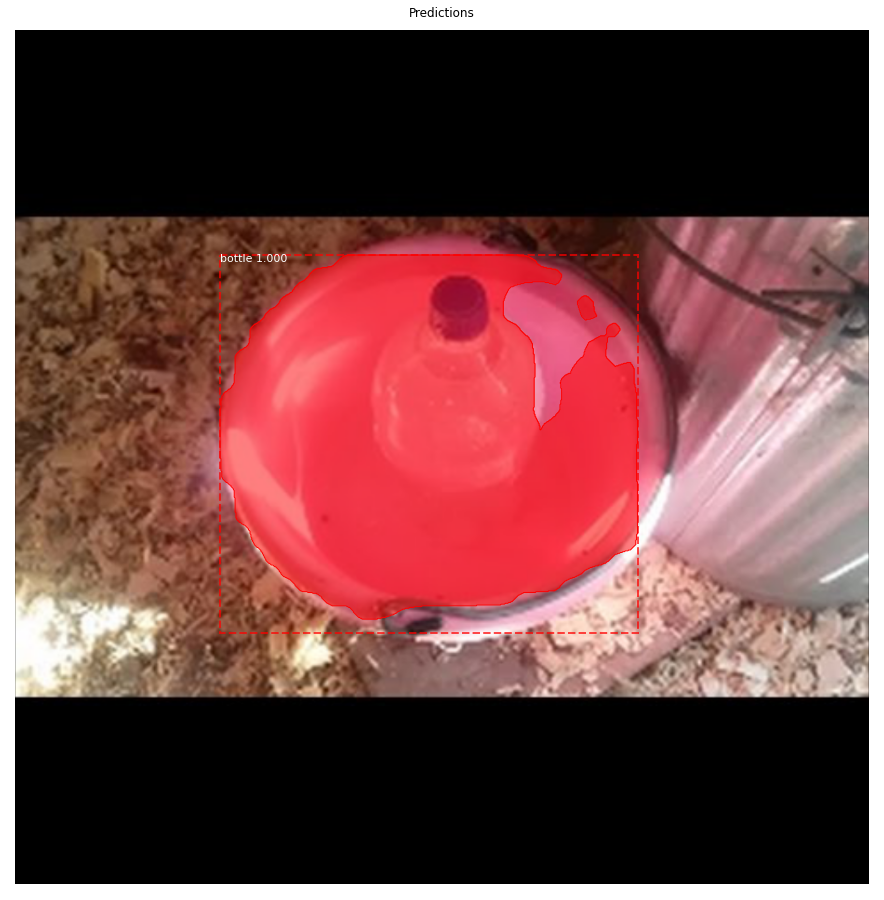

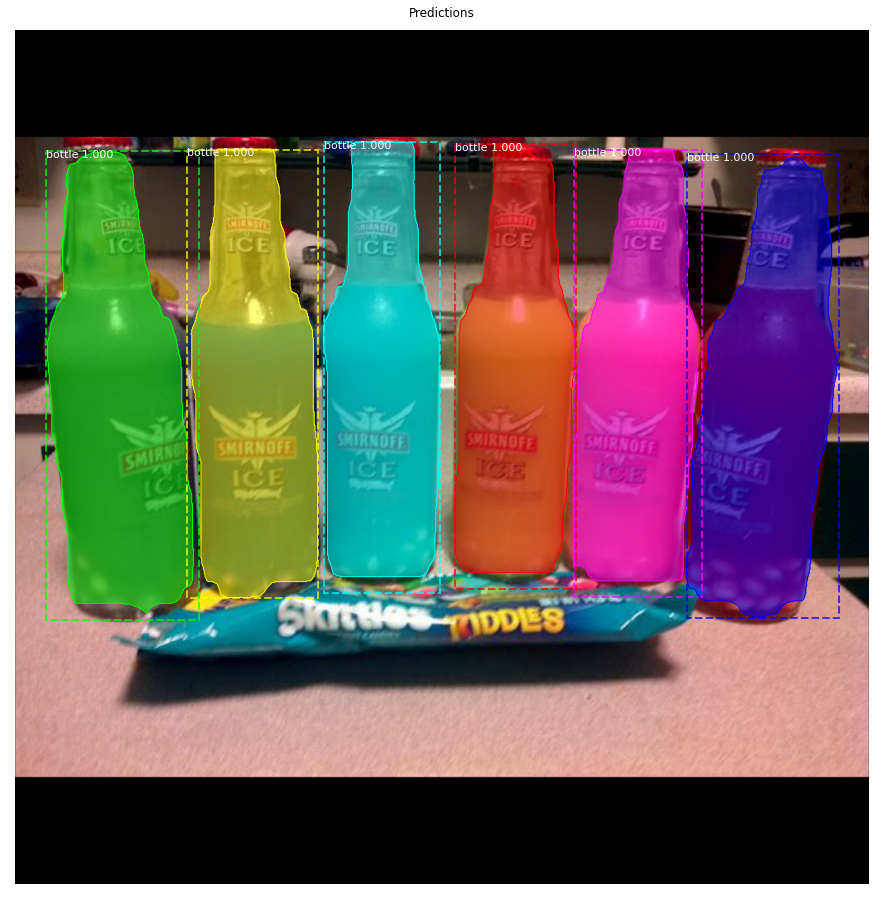

...

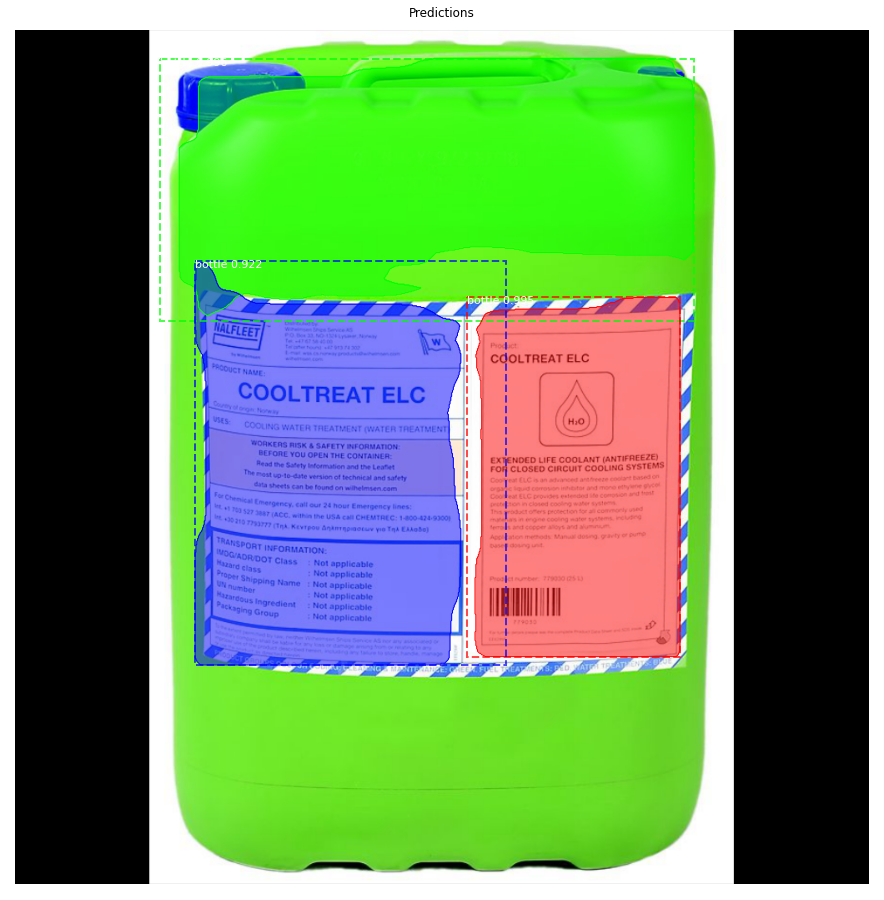

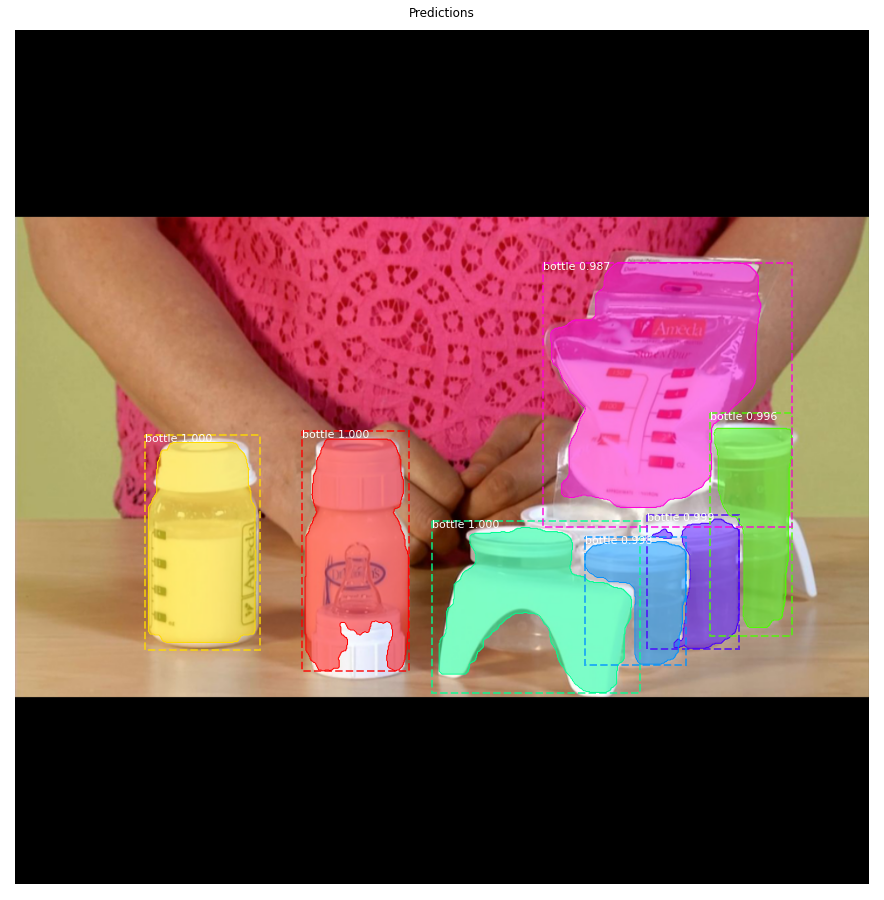

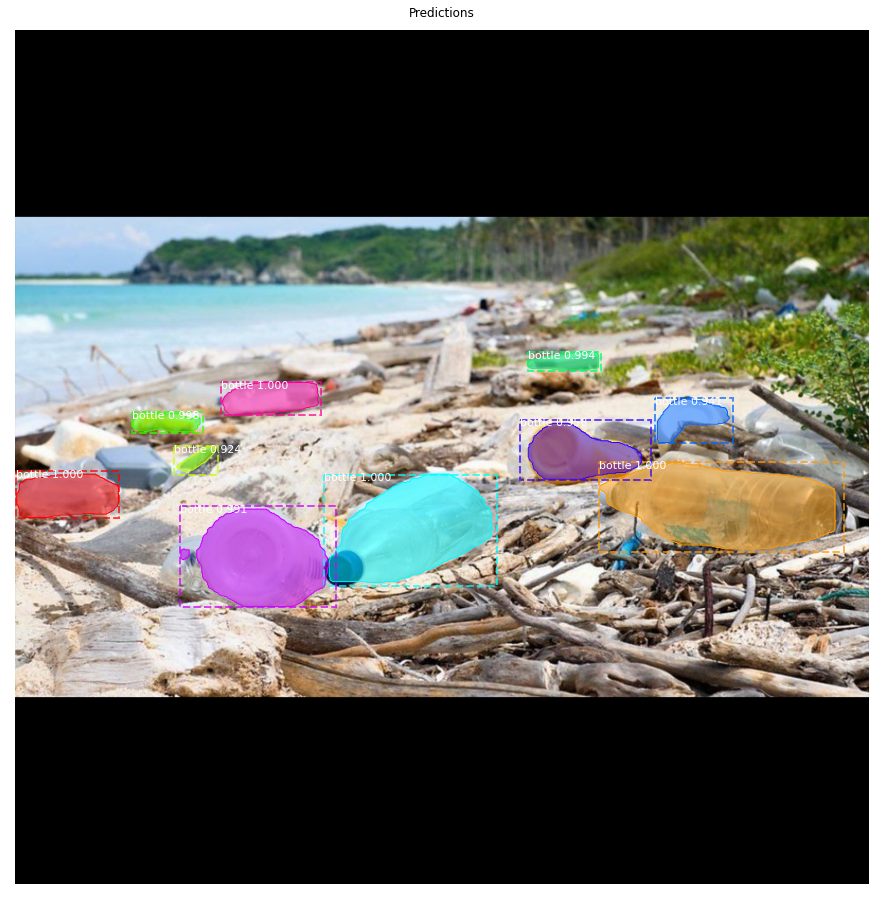

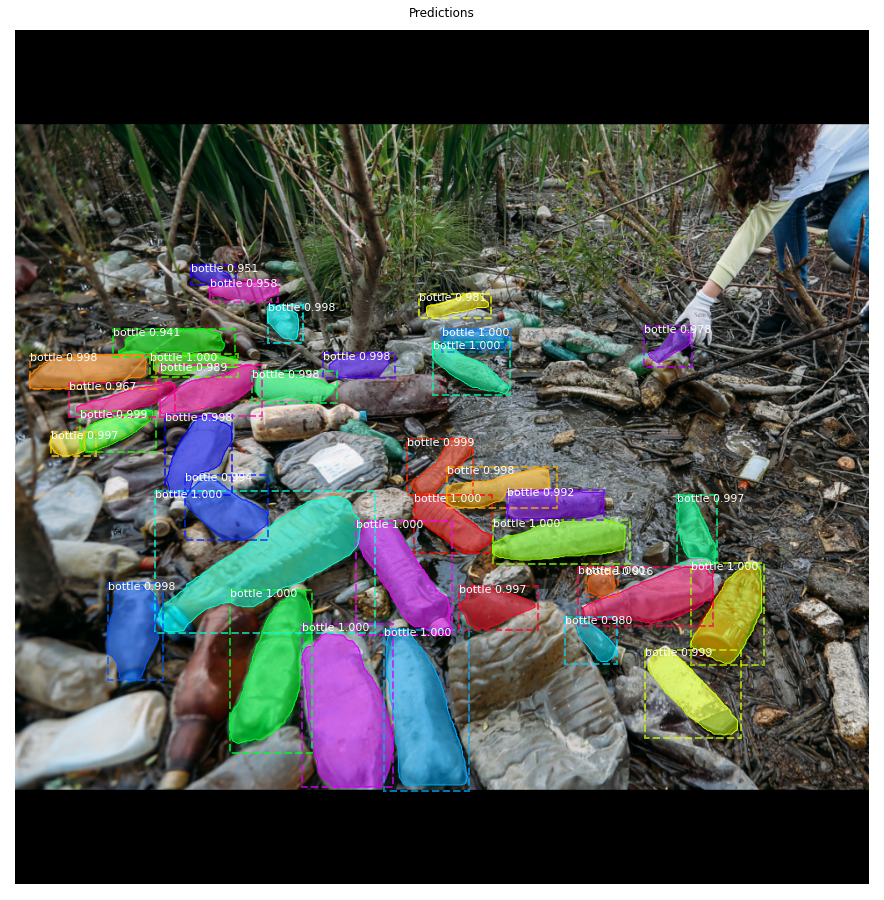

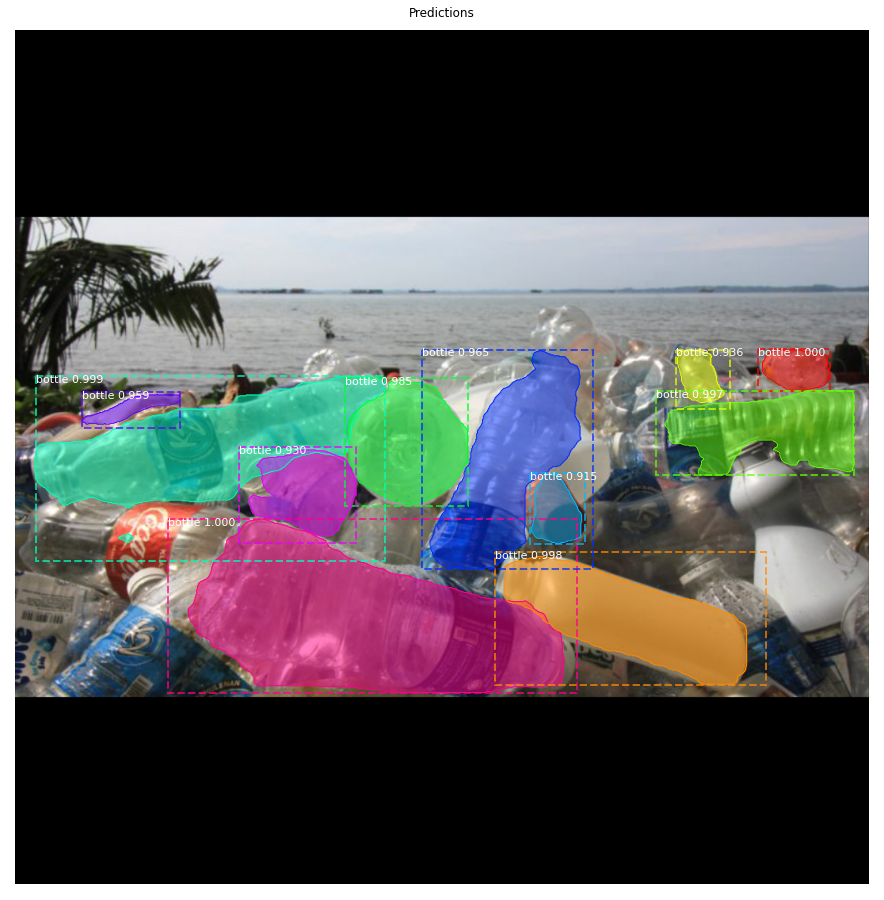

In [13]:
import numpy as np
image_idt = np.random.choice(dataset_train.image_ids, 10, replace=False)
#print(image_idt)
image_idv = np.random.choice(dataset_val.image_ids,10, replace=False)
#print(image_idv)

# For all Validation data
for image_idv in dataset_val.image_ids:
  image, image_meta, gt_class_id, gt_bbox, gt_mask =\
      modellib.load_image_gt(dataset_val, config, image_idv, use_mini_mask=False)
  info = dataset_val.image_info[image_idv]
  print("===", image_idv)
  print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_idv, 
                                         dataset_val.image_reference(image_idv)))

  # Run object detection
  results = model.detect([image], verbose=1)

  # Display results
  ax = get_ax(1)
  r = results[0]

  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                              dataset_val.class_names, r['scores'], ax=ax,
                              title="Predictions")
  log("gt_class_id", gt_class_id)
  log("gt_bbox", gt_bbox)
  log("gt_mask", gt_mask)

0.33913043737411497


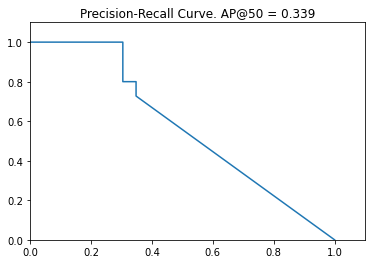

In [10]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
print(AP)
visualize.plot_precision_recall(AP, precisions, recalls)

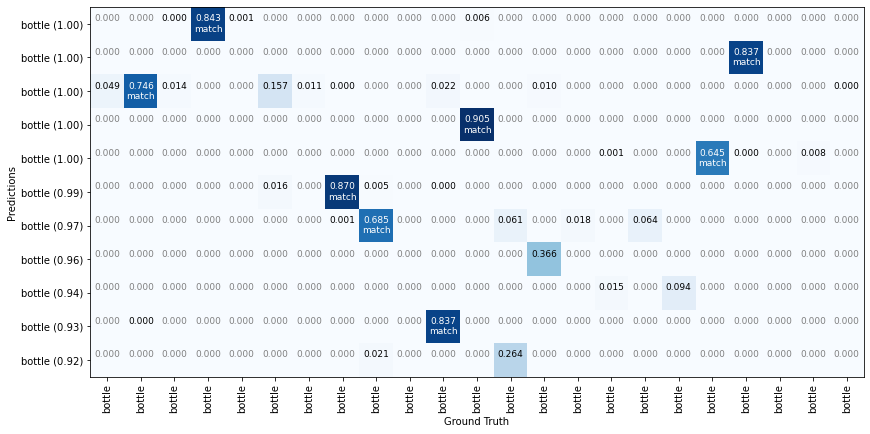

In [11]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset_val.class_names)

In [13]:
# Since it is a small dataset all images considered to calculate Compute VOC-Style mAP @ IoU=0.5
# However selective precision can be done.
# Running on 10 images. Increase for better accuracy.
#image_ids_val = np.random.choice(dataset_val.image_ids, 10,replace=False)
#image_ids_train = np.random.choice(dataset_train.image_ids, 10,replace=False)

APs_val = []
for image_idv in dataset_val.image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, config,
                               image_idv, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs_val.append(AP)
    
    APs_train = []
for image_idt in dataset_train.image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_train, config,
                               image_idt, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs_train.append(AP)
    #print(image_idt,":",AP)
print(APs_val)
print(APs_train)

print("mAP_train for images :", np.mean(APs_train))
print("mAP_val for images : ", np.mean(APs_val))

[1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.45263158977031703, 0.3961464208335125, 0.33913043737411497]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.949999988079071, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.7142857313156128, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9583333134651184, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.979797959327697

In [12]:
import numpy as np
# Compute VOC-Style mAP @ IoU=0.5
# Running on all images in val ... sample images can be considered to evaluate. Increase sample size for better accuracy.
image_ids = np.random.choice(dataset_val.image_ids,15,replace=False)
#image_ids = [14,13,12] # to select specific image 
APs = []
print("Image id",image_ids)
for i in [0.5,0.75,0.90]:
    for image_id in image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_val, config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
        # Run object detection
        results = model.detect([image], verbose=0)
        r = results[0]
        # Compute AP
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], i)
        
        APs.append(AP)
        
    print(APs,i)
    print("mAP(",i,"):", np.mean(APs))
    APs = []


Image id [ 6  0 10  5 12  2  9  8 14  1 11 13  3  7  4]
[1.0, 1.0, 0.0, 1.0, 0.45263158977031703, 1.0, 1.0, 1.0, 0.33913043737411497, 1.0, 1.0, 0.3961464208335125, 0.0, 1.0, 1.0] 0.5
mAP( 0.5 ): 0.7458605631985297
[1.0, 1.0, 0.0, 1.0, 0.28947367519140244, 1.0, 1.0, 0.5877551176718303, 0.17028985234598318, 1.0, 0.5, 0.24830691570828015, 0.0, 1.0, 1.0] 0.75
mAP( 0.75 ): 0.6530550373944998
[1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.010869565419852734, 0.0, 0.5, 0.008438818777600924, 0.0, 1.0, 0.6666666865348816] 0.9
mAP( 0.9 ): 0.41239833804882237


In [23]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 15 images. Increase for better accuracy according to val dataset.
image_ids = np.random.choice(dataset_val.image_ids, 15,replace = False)

APs = []
for image_id in dataset_val.image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]

    # Compute AP
 
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.7458605631985296


In [5]:
import numpy as np
# Compute VOC-Style mAP @ IoU=0.5,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95
# Running on 15 images in Validation dataset to get better accuracy.
image_ids = np.random.choice(dataset_val.image_ids,15,replace=False)
#image_ids = [0,14,1]
APs = []
coco_mAP = []
print("Image id",image_ids)
for i in [0.5,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95]:
    for image_id in image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_val, config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
        # Run object detection
        results = model.detect([image], verbose=0)
        r = results[0]
        # Compute AP
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], i)
        
        APs.append(AP)
        
    #print(APs,i)
    mAP = np.mean(APs)
    print("mAP(",i,"):", mAP)
    coco_mAP.append(mAP)
    APs = []
print("coco_mAP_val:",np.mean(coco_mAP)) 

Image id [ 7  4 13  8  5 14 10  3 12  9  2  1 11  0  6]
mAP( 0.5 ): 0.7458605631985297
mAP( 0.55 ): 0.7400802885292003
mAP( 0.6 ): 0.7391919256675812
mAP( 0.65 ): 0.7299168629034212
mAP( 0.7 ): 0.7190953631240562
mAP( 0.75 ): 0.6530550373944998
mAP( 0.8 ): 0.6288908146901311
mAP( 0.85 ): 0.5672862910838645
mAP( 0.9 ): 0.41239833804882237
mAP( 0.95 ): 0.0
coco_mAP_val: 0.5935775484640107


['test1.jpg', 'junktest2.jpg', 'test4.jpg']
test1.jpg
Processing 1 images
image                    shape: (450, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


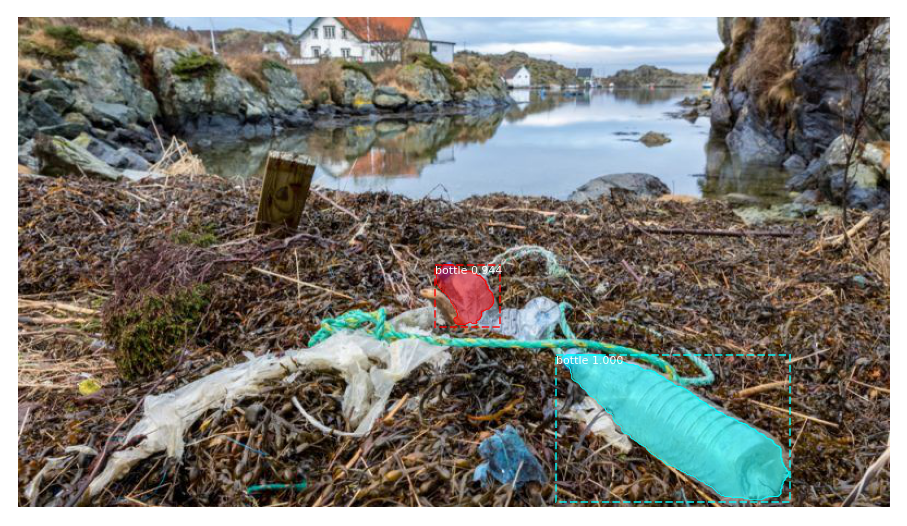

junktest2.jpg
Processing 1 images
image                    shape: (630, 1500, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1500.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


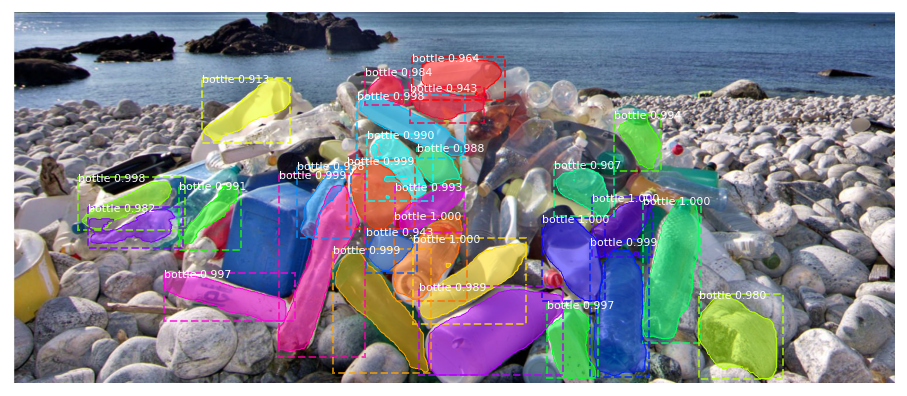

test4.jpg
Processing 1 images
image                    shape: (450, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


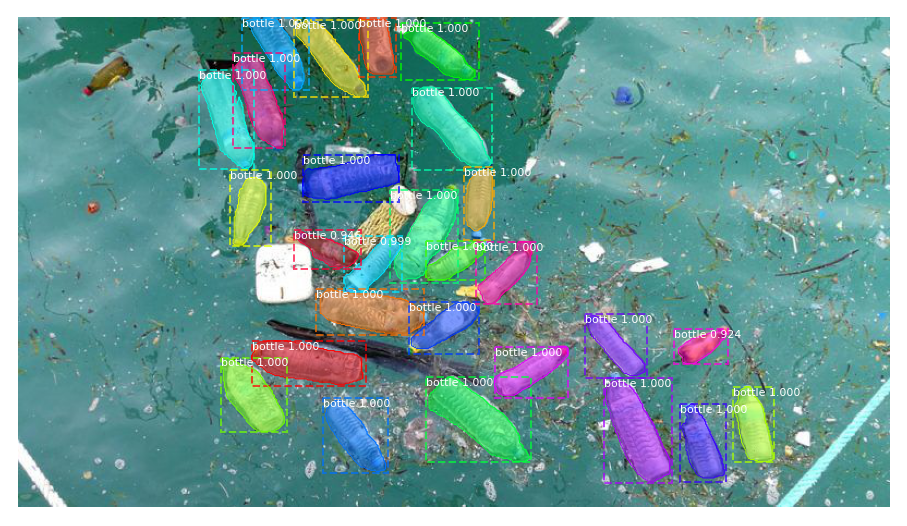

In [11]:

#detect for all Images from folder

def load_image_into_numpy_array(image):
    # The function supports only grayscale images
    assert len(image.shape) == 2, "Not a grayscale input image" 
    last_axis = -1
    dim_to_repeat = 2
    repeats = 3
    grscale_img_3dims = np.expand_dims(image, last_axis)
    training_image = np.repeat(grscale_img_3dims, repeats, dim_to_repeat).astype('uint8')
    assert len(training_image.shape) == 3
    assert training_image.shape[-1] == 3
    return training_image    
class_names = [ 'BG', 'bottle']
# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")
# Load a random image from the images folder


file_names = next(os.walk(IMAGE_DIR))[2]
print(file_names)

for imgid in file_names:
    print(imgid)
    i=0    
    image= skimage.io.imread(os.path.join(IMAGE_DIR,imgid ))
    if image.shape[-1] == 4: 
        image = image[..., :3]  # for png to jpg
        
    elif image.shape[-1] != 3:  # for gray scale image
         image=load_image_into_numpy_array(image)        
        
# Run detection
    results = model.detect([image], verbose=1)
# Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
    i=i+1

Processing 1 images
image                    shape: (168, 300, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


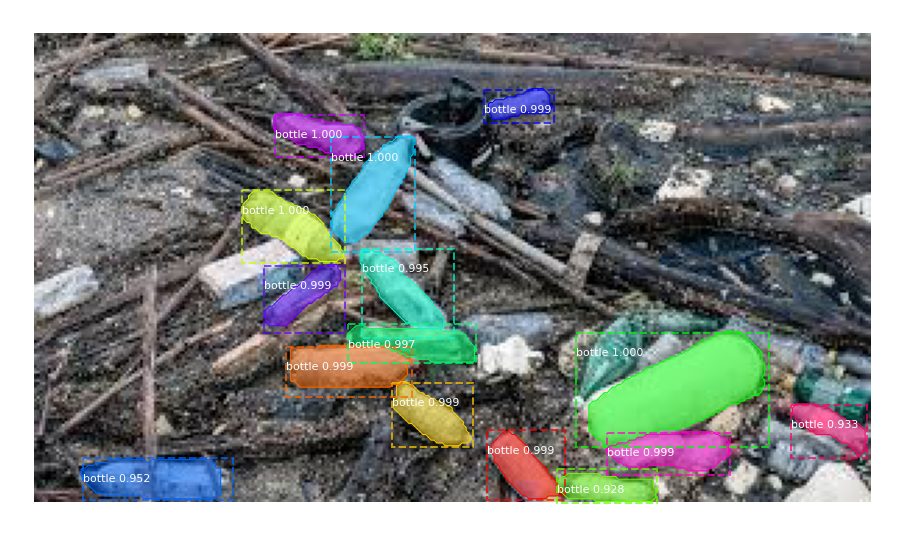

In [22]:
def load_image_into_numpy_array(image):
    # The function supports only grayscale images
    assert len(image.shape) == 2, "Not a grayscale input image" 
    last_axis = -1
    dim_to_repeat = 2
    repeats = 3
    grscale_img_3dims = np.expand_dims(image, last_axis)
    training_image = np.repeat(grscale_img_3dims, repeats, dim_to_repeat).astype('uint8')
    assert len(training_image.shape) == 3
    assert training_image.shape[-1] == 3
    return training_image

import os
class_names = [ 'BG', 'bottle']
# Load a random image from the images folder
#file_names = next(os.walk(IMAGE_DIR))[2]
TEST_DIR=os.path.join(ROOT_DIR,'images')
image = skimage.io.imread(os.path.join(TEST_DIR, 'testimg2.jpeg'))

if image.shape[-1] == 4:
        image = image[..., :3]

if image.shape[-1] != 3:
    image=load_image_into_numpy_array(image)

# Run detection
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])    

Processing 1 images
image                    shape: (450, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


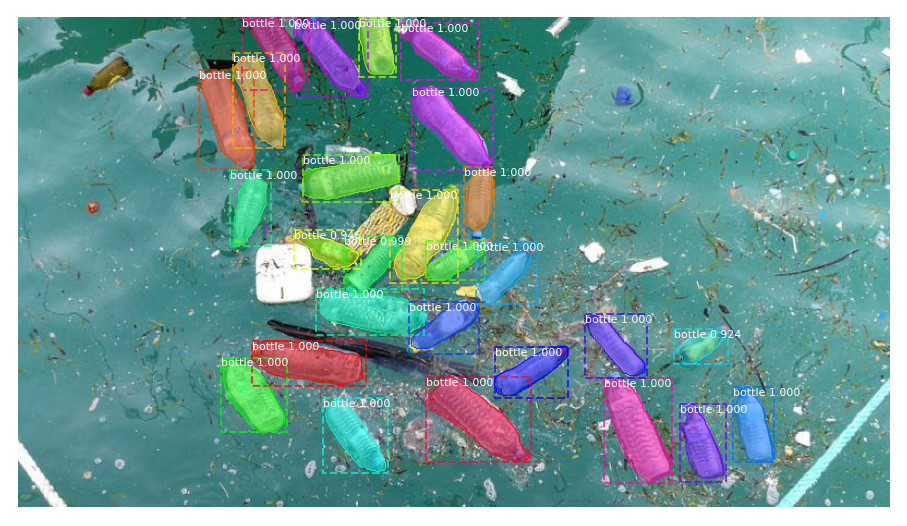

In [15]:
class_names = [ 'BG', 'bottle']
# Load a random image from the images folder
#file_names = next(os.walk(IMAGE_DIR))[2]
TEST_DIR=os.path.join(ROOT_DIR,'images')
image = skimage.io.imread(os.path.join(TEST_DIR, 'test4.jpg'))

# Run detection
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])